In [70]:
import pandas as pd
pd.set_option('mode.chained_assignment', None)
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import h5py
from scipy import sparse
from pathlib import Path
import scanpy as sc
import squidpy as sq
import copy
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report

import csv
from itertools import permutations
import math

In [23]:
samples = [151507, 151508, 151669, 151670, 151673, 151674]
str_samples = [str(sample) for sample in samples]
['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']

palette = {          
    '1': "#ED247F", 1: "#ED247F", 'L1': "#ED247F",
    '2': '#397CBA', 2: '#397CBA', 'L2': '#397CBA',
    '3': '#49AB4F', 3: '#49AB4F', 'L3': '#49AB4F',
    '4': '#9A4D9E', 4: '#9A4D9E', 'L4': '#9A4D9E',
    '5': '#F9D606', 5: '#F9D606', 'L5': '#F9D606',
    '6': '#F47C20', 6: '#F47C20', 'L6': '#F47C20',
    '7': '#171717', 7: '#171717', 'WM': '#171717',
    '8': '#676767', 8: '#676767', 
}

In [36]:
# col_metadata = pd.read_csv(r'../data/column_metadata.csv', index_col=0)
# row_metadata = pd.read_csv(r'../data/row_metadata.csv', index_col=0)
# filtfiles = [x for x in Path(r'..\data').glob('*filt*.h5')]
# filtfiles = [x for x in filtfiles if any(sample for sample in samples if str(sample) in str(x))]

# Load datasets
1. Raw, non-normalized counts
2. normalized_total (scanpy)
3. Dino
4. SCT
5. Cell count (drop zeros, or set zero to 1?)
6. Square Root cell count

In [22]:
def load_sparse_mat(filtered_filename, sample_number):
    with h5py.File(filtered_filename, 'r') as f:
        data = np.array(f['matrix']['data'])
        filtered_barcodes = np.array(f['matrix']['barcodes']).astype('U13')  # b'AAACAAGTATCTCCCA-1'  4992 columns
        _id = np.array(f['matrix']['features']['id']).astype('U13')   #  b'ENSG00000275063' 33538 rows
        name = np.array(f['matrix']['features']['name']).astype('U13')   # Gene name b'AL627309.3' 33538 rows
        indices = np.array(f['matrix']['indices'])
        indptr = np.array(f['matrix']['indptr'])
        shape = np.array(f['matrix']['shape'])
        
    barcodes = pd.DataFrame(filtered_barcodes)
    barcodes['in_filtered'] = barcodes[0].isin(filtered_barcodes).astype('int')
    m = sparse.csr_matrix((data, indices, indptr), shape=(shape[1], shape[0]))
    index = [barcodes[0].astype('str').to_list(), 
             [str(sample_number)]*len(barcodes)]
    columns = [name, _id]
    return m.toarray()

def load_data():
    col_metadata = pd.read_csv(r'../data/column_metadata.csv', index_col=0)
    row_metadata = pd.read_csv(r'../data/row_metadata.csv', index_col=0)
    filtfiles = [x for x in Path(r'..\data').glob('*filt*.h5')]
    filtfiles = [file for file in filtfiles if any(sample for sample in samples if str(sample) in str(file))]
    
    dfs = []
    for filtered_file in filtfiles:
        sample_number = filtered_file.stem.split('_')[0]
        df = load_sparse_mat(filtered_filename=filtered_file, 
                             sample_number=sample_number)
        dfs.append(df)
    cdf = np.concatenate(dfs)
    adata_master = sc.AnnData(
        X=cdf,   
        obs=col_metadata.loc[col_metadata.sample_name.isin(samples)],     
        var=row_metadata)  
    del cdf
    del dfs
    return adata_master
raw = load_data()

# Filter genes that had below a certain count (gene list borrowed from output from the R script)
high_count_genes = []
with open('../data/Dino_norms/151507_Dino_norm_sparse.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for line in reader:
        high_count_genes.append(line[0])

# has_layer_label = raw.obs[raw.obs['spatialLIBD'].notna()].index  # drop any spatialLIBD with NaN label

raw = raw[:, high_count_genes]
raw

C:\Users\bjanderson23\anaconda3\lib\site-packages\ipykernel_launcher.py:35: FutureWarning: X.dtype being converted to np.float32 from int32. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


View of AnnData object with n_obs × n_vars = 23081 × 2831
    obs: 'barcode', 'sample_name', 'tissue', 'row', 'col', 'imagerow', 'imagecol', 'Cluster', 'height', 'width', 'sum_umi', 'sum_gene', 'subject', 'position', 'replicate', 'subject_position', 'discard', 'key', 'cell_count', 'SNN_k50_k4', 'SNN_k50_k5', 'SNN_k50_k6', 'SNN_k50_k7', 'SNN_k50_k8', 'SNN_k50_k9', 'SNN_k50_k10', 'SNN_k50_k11', 'SNN_k50_k12', 'SNN_k50_k13', 'SNN_k50_k14', 'SNN_k50_k15', 'SNN_k50_k16', 'SNN_k50_k17', 'SNN_k50_k18', 'SNN_k50_k19', 'SNN_k50_k20', 'SNN_k50_k21', 'SNN_k50_k22', 'SNN_k50_k23', 'SNN_k50_k24', 'SNN_k50_k25', 'SNN_k50_k26', 'SNN_k50_k27', 'SNN_k50_k28', 'GraphBased', 'Maynard', 'Martinowich', 'layer_guess', 'layer_guess_reordered', 'layer_guess_reordered_short', 'expr_chrM', 'expr_chrM_ratio', 'SpatialDE_PCA', 'SpatialDE_pool_PCA', 'HVG_PCA', 'pseudobulk_PCA', 'markers_PCA', 'SpatialDE_UMAP', 'SpatialDE_pool_UMAP', 'HVG_UMAP', 'pseudobulk_UMAP', 'markers_UMAP', 'SpatialDE_PCA_spatial', 'SpatialDE

In [243]:
# nt = Normalized Total method of normalization
nt = copy.copy(raw)

## Make a loop that performs/loads the normalization, log1p, HVG, then the clusterings: PCA, neighbors, UMAP, Leiden on each sample in the normalization method

### Because you can't do some of the normalizations and clusterings on all samples at the same time, they need to be split into 6 DFs each

In [ ]:
# Get obs df for each sample
obs_dfs = {}
for sample in samples:
    obs_dfs[sample] = 

In [28]:
raws = {}   # raw, non-normalized data
nts = {}    # normalized total method
dinos = {}  # Jurassic Park
scts = {}   # SCTransform
ccs = {}    # Cell count 
srs = {}    # Square root cell count

## Raw data

In [94]:
for sample in samples:
    subset = raw[raw.obs['sample_name'] == sample]
    raws[sample] = subset

## scanpy `normalize_total` 

In [95]:
for sample in samples:
    print(sample)
    subset = raw[raw.obs['sample_name'] == sample]
    sc.pp.normalize_total(subset, exclude_highly_expressed=True, inplace=True)
    nts[sample] = subset

151507


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


151508
151669
151670
151673
151674


## Dino matrix

In [96]:
# Populate dinos
for i, file in enumerate(Path('../data/Dino_norms').glob('*')):
    sample = int(file.stem.split('_')[0])
    if not any(sample for sample in str_samples if sample in str(file)):
        continue
    obs = raw.obs[raw.obs['sample_name'] == sample]
    var = raw.var
    dinos[sample] = sc.AnnData(pd.read_csv(file, index_col=0).values.T, obs=obs, var=var)
# dinos

C:\Users\bjanderson23\anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  


## SCTransform matrix

In [97]:
# Populate SCTransforms
for i, file in enumerate(Path('../data/SCT_norms').glob('*')):
    sample = int(file.stem.split('_')[0])
    if not any(sample for sample in str_samples if sample in str(file)):
        continue
    obs = raw.obs[raw.obs['sample_name'] == sample]
    var = raw.var
    scts[sample] = sc.AnnData(pd.read_csv(file, index_col=0).values.T, obs=obs, var=var)
# scts

C:\Users\bjanderson23\anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  


## Cell count normalization

In [74]:
# cc_map = {x: x for x in range(30)}
# cc_map[0] = 0.5
# print(cc_map)
# sqrt_cc_map = {x: math.sqrt(x) for x in range(30)}
# sqrt_cc_map[0] = 0.5
# print(sqrt_cc_map)

# testcc = raw.obs.loc[raw.obs['sample_name']==151507, 'cell_count'].replace(0, 1)
# test = raw[raw.obs['sample_name'] == 151507]
# test.X = test.X / testcc[:, None]
# test.X
# # test[testcc]

{0: 0.5, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29}
{0: 0.5, 1: 1.0, 2: 1.4142135623730951, 3: 1.7320508075688772, 4: 2.0, 5: 2.23606797749979, 6: 2.449489742783178, 7: 2.6457513110645907, 8: 2.8284271247461903, 9: 3.0, 10: 3.1622776601683795, 11: 3.3166247903554, 12: 3.4641016151377544, 13: 3.605551275463989, 14: 3.7416573867739413, 15: 3.872983346207417, 16: 4.0, 17: 4.123105625617661, 18: 4.242640687119285, 19: 4.358898943540674, 20: 4.47213595499958, 21: 4.58257569495584, 22: 4.69041575982343, 23: 4.795831523312719, 24: 4.898979485566356, 25: 5.0, 26: 5.0990195135927845, 27: 5.196152422706632, 28: 5.291502622129181, 29: 5.385164807134504}


# Drop all spots with NaN label in spatialLIBD column

In [98]:
set_ = set()
for d in [raws, nts, dinos, scts]:
    for sample in samples:
        [set_.add(x) for x in d[sample].obs['spatialLIBD'].unique()]
print(set_)

for d in [raws, nts, dinos, scts]: #, ccs, srs]:
    for sample in samples:
        has_layer_label = raw.obs[(raw.obs['spatialLIBD'].notna()) & (raw.obs['sample_name'] == sample)].index  
        # drop any spatialLIBD with NaN label
        d[sample] = d[sample][has_layer_label]

### Check that dropping all NaNs from spatial LIBD worked

In [99]:
set_ = set()
for d in [raws, nts, dinos, scts]:
    for sample in samples:
        [set_.add(x) for x in d[sample].obs['spatialLIBD'].unique()]
set_

{'L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM'}

In [236]:
d[151507].obsm

AnnData object with n_obs × n_vars = 4221 × 2831
    obs: 'barcode', 'sample_name', 'tissue', 'row', 'col', 'imagerow', 'imagecol', 'Cluster', 'height', 'width', 'sum_umi', 'sum_gene', 'subject', 'position', 'replicate', 'subject_position', 'discard', 'key', 'cell_count', 'SNN_k50_k4', 'SNN_k50_k5', 'SNN_k50_k6', 'SNN_k50_k7', 'SNN_k50_k8', 'SNN_k50_k9', 'SNN_k50_k10', 'SNN_k50_k11', 'SNN_k50_k12', 'SNN_k50_k13', 'SNN_k50_k14', 'SNN_k50_k15', 'SNN_k50_k16', 'SNN_k50_k17', 'SNN_k50_k18', 'SNN_k50_k19', 'SNN_k50_k20', 'SNN_k50_k21', 'SNN_k50_k22', 'SNN_k50_k23', 'SNN_k50_k24', 'SNN_k50_k25', 'SNN_k50_k26', 'SNN_k50_k27', 'SNN_k50_k28', 'GraphBased', 'Maynard', 'Martinowich', 'layer_guess', 'layer_guess_reordered', 'layer_guess_reordered_short', 'expr_chrM', 'expr_chrM_ratio', 'SpatialDE_PCA', 'SpatialDE_pool_PCA', 'HVG_PCA', 'pseudobulk_PCA', 'markers_PCA', 'SpatialDE_UMAP', 'SpatialDE_pool_UMAP', 'HVG_UMAP', 'pseudobulk_UMAP', 'markers_UMAP', 'SpatialDE_PCA_spatial', 'SpatialDE_pool_PCA

In [ ]:
d[151507].obsm['X_pca'].shape

In [240]:
d[151507].varm['PCs'].shape

(2831, 50)

In [239]:
d[151507].obsm['X_pca'].shape

(4221, 50)

In [100]:
for d in [raws, nts, dinos, scts]:
    for sample in samples:
        print(sample)
        df = d[sample]
        sc.pp.log1p(df)
        sc.pp.highly_variable_genes(adata=df, n_top_genes=200, flavor='seurat')
#         print('pre neighbors')
        sc.pp.pca(df)
        sc.pp.neighbors(df, n_neighbors=15)
#         print('post neighbors')
        n_clusters = len(df.obs['spatialLIBD'].unique()) ## - 1  # SUBTRACT 1 TO REMOVE THE NaN SPOTS
        print(n_clusters)
        kmeans_labels = KMeans(n_clusters=n_clusters, random_state=1).fit(df.obsm['X_pca']).predict(df.obsm['X_pca'])

        df.obs['kmeans'] = kmeans_labels

        sc.tl.umap(df)
        clusters = [x for x in df.obs['Cluster'].unique()]
        df.obs['Cluster_str'] = df.obs['Cluster'].astype('category')
        sc.tl.leiden(df, key_added='leiden_clusters')#, restrict_to=('Cluster_str', clusters))
        sc.tl.louvain(df, key_added='louvain_clusters')#, restrict_to=('Cluster_str', clusters))

151507


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151508


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151669


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151670


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151673


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151674


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151507


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151508


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151669


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151670


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151673


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151674


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151507


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151508


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151669


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151670


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151673


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151674


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151507


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151508


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151669


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151670


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


5
151673


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7
151674


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:373: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


7


In [101]:
for sample in samples: 
    print('\n', sample)
    print(len(nts[sample].obs['kmeans'].unique()))
    print((nts[sample].obs['kmeans'].unique()))
    print(len(nts[sample].obs['spatialLIBD'].unique()))
    print(len(nts[sample].obs['Cluster'].unique()))
    print(nts[sample].obs['leiden_clusters'].unique())
    print(nts[sample].obs['louvain_clusters'].unique())


 151507
7
[1 3 5 4 6 2 0]
7
6
['2', '3', '4', '5', '6', '0', '1', '7']
Categories (8, object): ['0', '1', '2', '3', '4', '5', '6', '7']
['1', '2', '6', '7', '0', '4', '5', '3', '8']
Categories (9, object): ['0', '1', '2', '3', ..., '5', '6', '7', '8']

 151508
7
[2 6 3 5 4 0 1]
7
5
['3', '4', '5', '0', '2', '1', '6']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']
['2', '4', '1', '5', '0', '3', '6']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

 151669
5
[3 0 1 2 4]
5
6
['1', '5', '2', '0', '4', '3', '6']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']
['0', '5', '1', '3', '2', '4', '6']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

 151670
5
[3 4 1 2 0]
5
7
['3', '6', '1', '2', '4', '5', '0']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']
['5', '3', '0', '1', '2', '4']
Categories (6, object): ['0', '1', '2', '3', '4', '5']

 151673
7
[4 2 6 5 3 1 0]
7
8
['3', '0', '2', '4', '1', '5', '6']
Categories (7, object): ['0',

In [147]:
raw.obs.columns

Index(['barcode', 'sample_name', 'tissue', 'row', 'col', 'imagerow',
       'imagecol', 'Cluster', 'height', 'width', 'sum_umi', 'sum_gene',
       'subject', 'position', 'replicate', 'subject_position', 'discard',
       'key', 'cell_count', 'SNN_k50_k4', 'SNN_k50_k5', 'SNN_k50_k6',
       'SNN_k50_k7', 'SNN_k50_k8', 'SNN_k50_k9', 'SNN_k50_k10', 'SNN_k50_k11',
       'SNN_k50_k12', 'SNN_k50_k13', 'SNN_k50_k14', 'SNN_k50_k15',
       'SNN_k50_k16', 'SNN_k50_k17', 'SNN_k50_k18', 'SNN_k50_k19',
       'SNN_k50_k20', 'SNN_k50_k21', 'SNN_k50_k22', 'SNN_k50_k23',
       'SNN_k50_k24', 'SNN_k50_k25', 'SNN_k50_k26', 'SNN_k50_k27',
       'SNN_k50_k28', 'GraphBased', 'Maynard', 'Martinowich', 'layer_guess',
       'layer_guess_reordered', 'layer_guess_reordered_short', 'expr_chrM',
       'expr_chrM_ratio', 'SpatialDE_PCA', 'SpatialDE_pool_PCA', 'HVG_PCA',
       'pseudobulk_PCA', 'markers_PCA', 'SpatialDE_UMAP',
       'SpatialDE_pool_UMAP', 'HVG_UMAP', 'pseudobulk_UMAP', 'markers_UMAP',
    

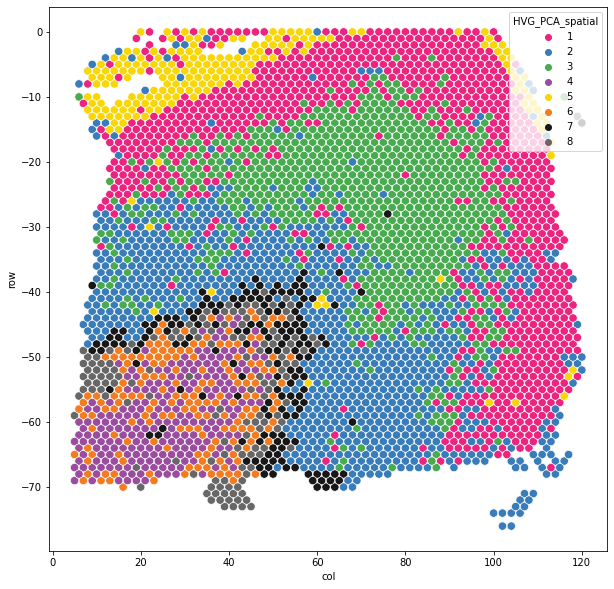

In [174]:
sl_int_map = {'L1': 1, 'L2': 2, 'L3': 3, 'L4': 4, 'L5': 5, 'L6': 6, 'WM': 7, np.nan: 7}

# df = nts[151673]
# df.obs['sl_int'] = df.obs['spatialLIBD'].map(sl_int_map)
# sns.scatterplot(
#         x=df.obs['col'], y=-1*df.obs['row'], 
#         hue=df.obs['sl_int'], 
#         s=70, 
#         palette=palette)
# plt.gcf().set_size_inches(10, 10)

plt.figure()
df = raw.obs.loc[raw.obs['sample_name'] == 151673]
sns.scatterplot(
    x=df['col'], y=-1*df['row'], 
    hue=df['HVG_PCA_spatial'], 
    s=70, 
    palette=palette,
    legend=True,
)
plt.gcf().set_size_inches(10, 10)

In [106]:
print(len([x for x in permutations([0,1,2,3,4,5,6], r=7)]))
print('5040 total permutations to test for best overlap')
# results = []
# for perm in permutations([1,2,3,4,5,6, 7], r=7):
#     map_ = {original: swap for original, swap in zip(df.obs['kmeans'], perm)}

#     result = (df.obs['sl_int'] == df.obs['kmeans'].map(map_)).sum()
#     results.append((result, perm))

5040
5040 total permutations to test for best overlap


In [102]:
balanced_accuracy_score(y_true=[1,1,2,2,3,3,4,4,4,4,4,4,4,4,4,4,4], y_pred=[2,1,2,1,3,1,4,1,4,4,4,4,4,4,4,4,4])

0.6022727272727273

# Computing accuracy between "Ground Truth" and KMeans prediction is difficult for two reasons:
## 1. Simple accuracy unfairly weights results that favor the layer with the most spots. Use balanced accuracy
## 2. Testing every permutation of the 7 labels to check for the best balanced accuracy is time consuming, so do it all before and save result

In [194]:
raws[151507].obs.kmeans

AAACAACGAATAGTTC-1    3
AAACAAGTATCTCCCA-1    6
AAACAATCTACTAGCA-1    0
AAACACCAATAACTGC-1    0
AAACAGCTTTCAGAAG-1    6
                     ..
TTGTTGTGTGTCAAGA-1    2
TTGTTTCACATCCAGG-1    0
TTGTTTCATTAGTCTA-1    0
TTGTTTCCATACAACT-1    0
TTGTTTGTGTAAATTC-1    0
Name: kmeans, Length: 4221, dtype: int32

In [114]:
def get_acc_results(acc, acc_results):
    for d, d_name in zip([raws, nts, scts, dinos], ['raws', 'nts', 'scts', 'dinos']):
        acc_results[d_name] = {}        
        for sample in samples:
            print(sample)
            df = d[sample].obs
            unique_labels = df['spatialLIBD'].unique()
            unique_kmeans = df['kmeans'].unique()
            li = []
            for perm in permutations(unique_labels, r=len(unique_labels)):
    #             print(perm)
                map_ = {original: swap for original, swap in zip(unique_kmeans, perm)}
    #             print(map_)
                result = acc(df['spatialLIBD'], df['kmeans'].map(map_))
    #             print(result)
                li.append((result, map_))
            acc_results[d_name][sample] = sorted(li, reverse=True, key=lambda x: x[0])

In [115]:
# balanced_accuracy_results = {}
# get_acc_results(balanced_accuracy_score, balanced_accuracy_results)

151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674


In [116]:
# accuracy_results = {}
# get_acc_results(accuracy_score, accuracy_results)

151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674
151507
151508
151669
151670
151673
151674


In [119]:
# r = []
# i = 0
# unique_labels = df['spatialLIBD'].unique()
# for perm in permutations(unique_labels, r=len(unique_labels)):
#     map_ = {original: swap for original, swap in zip(unique_labels, perm)}
#     #         print(map_)
#     result = accuracy_score(df['spatialLIBD'], df['spatialLIBD'].map(map_))
#     r.append((result, map_))
#     i += 1
#     if i % 100 == 0:
#         print(i)
# print(sorted(r, reverse=True))

## Find the best accuracy for HVG_PCA_spatial

In [130]:
samples

[151507, 151508, 151669, 151670, 151673, 151674]

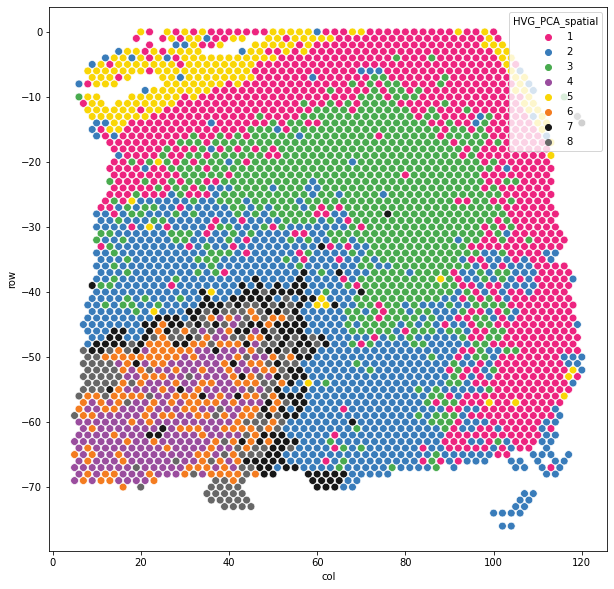

In [175]:
for sample in samples:
    print(raw.obs.loc[raw.obs['sample_name'] == sample, 'HVG_PCA_spatial'].value_counts()[-2:])

7    73
8     9
Name: HVG_PCA_spatial, dtype: int64
7    125
8    105
Name: HVG_PCA_spatial, dtype: int64
7    77
8    45
Name: HVG_PCA_spatial, dtype: int64
7    74
8    49
Name: HVG_PCA_spatial, dtype: int64
7    167
8    140
Name: HVG_PCA_spatial, dtype: int64
7    207
8     68
Name: HVG_PCA_spatial, dtype: int64


In [182]:
samples

[151507, 151508, 151669, 151670, 151673, 151674]

## Why did they create 8 groups in `HVG_PCA_spatial` for the 151669, 151670 samples when there were only 5 distinct layers? 
### Makes no sense, so skip the best_map for `HVG_PCA_spatial`

In [180]:
# hps_accuracy = {}  # hps = HVG_PCA_spatial
# hps_balanced_accuracy = {}
       
# for sample in samples:
#     print(sample)
#     df = raws[sample].obs
#     df['HVG_PCA_spatial_mod'] = df['HVG_PCA_spatial'].map({8: 7}) # combine 8 into 7 because 8 is low abundance
#     unique_labels = df['spatialLIBD'].unique()
#     unique_hps = df['HVG_PCA_spatial_mod'].unique()
#     acc = []
#     bal_acc = []
#     for perm in permutations(unique_labels, r=len(unique_labels)):
#         map_ = {original: swap for original, swap in zip(unique_hps, perm)}
#         acc_result = accuracy_score(df['spatialLIBD'], df['HVG_PCA_spatial_mod'].map(map_))
#         acc.append((acc_result, map_))
#         bal_acc_result = accuracy_score(df['spatialLIBD'], df['HVG_PCA_spatial_mod'].map(map_))
#         bal_acc.append((bal_acc_result, map_))
#     hps_accuracy[sample] = sorted(acc, reverse=True, key=lambda x: x[0])
#     hps_balanced_accuracy[sample] = sorted(bal_acc, reverse=True, key=lambda x: x[0])

151507
151508
151669
151670
151673
151674


In [188]:
accuracy_results

{'raws': {151507: [(0.33214877990997393,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L6', 5: 'L4', 1: 'L5', 4: 'L2'}),
   (0.3304904051172708,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L4', 5: 'L6', 1: 'L5', 4: 'L2'}),
   (0.32764747690120827,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L5', 5: 'L4', 1: 'L6', 4: 'L2'}),
   (0.3248045486851457,
    {3: 'L1', 6: 'L5', 0: 'WM', 2: 'L3', 5: 'L4', 1: 'L6', 4: 'L2'}),
   (0.3243307273158019,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L4', 5: 'L5', 1: 'L6', 4: 'L2'}),
   (0.3236199952617863,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L5', 5: 'L6', 1: 'L4', 4: 'L2'}),
   (0.32243544183842693,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L2', 5: 'L6', 1: 'L5', 4: 'L4'}),
   (0.32196162046908317,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L6', 5: 'L5', 1: 'L4', 4: 'L2'}),
   (0.3214877990997394,
    {3: 'L1', 6: 'L3', 0: 'WM', 2: 'L2', 5: 'L4', 1: 'L5', 4: 'L6'}),
   (0.32101397773039564,
    {3: 'L1', 6: 'L3', 0: 'L5', 2: 'L4', 5: 'WM', 1: 'L6', 4: 'L2'}),
   (0.3207770670457238,
    {3: 'L1', 6

In [ ]:
sc.pp.normalize_total

In [215]:
samples

[151507, 151508, 151669, 151670, 151673, 151674]

In [235]:
d[151507].var

,source,type,gene_id,gene_version,gene_name,gene_source,gene_biotype,gene_search,is_top_hvg,highly_variable,means,dispersions,dispersions_norm
ENSG00000188290,ensembl_havana,gene,ENSG00000188290,10,HES4,ensembl_havana,protein_coding,HES4; ENSG00000188290,True,False,0.117904,-0.383964,0.528467
ENSG00000187608,ensembl_havana,gene,ENSG00000187608,8,ISG15,ensembl_havana,protein_coding,ISG15; ENSG00000187608,True,False,0.175596,-0.433714,0.318194
ENSG00000188157,ensembl_havana,gene,ENSG00000188157,14,AGRN,ensembl_havana,protein_coding,AGRN; ENSG00000188157,False,False,0.086487,-0.405400,-0.127720
ENSG00000078808,ensembl_havana,gene,ENSG00000078808,16,SDF4,ensembl_havana,protein_coding,SDF4; ENSG00000078808,False,False,0.124868,-0.409737,-0.260494
ENSG00000131584,ensembl_havana,gene,ENSG00000131584,18,ACAP3,ensembl_havana,protein_coding,ACAP3; ENSG00000131584,False,False,0.136740,-0.437615,0.233300
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000212907,insdc,gene,ENSG00000212907,2,MT-ND4L,insdc,protein_coding,MT-ND4L; ENSG00000212907,True,False,0.819169,-1.446991,0.460836
ENSG00000198886,insdc,gene,ENSG00000198886,2,MT-ND4,insdc,protein_coding,MT-ND4; ENSG00000198886,False,False,1.562522,-4.250686,-1.164225
ENSG00000198786,insdc,gene,ENSG00000198786,2,MT-ND5,insdc,protein_coding,MT-ND5; ENSG00000198786,True,False,1.083463,-2.234778,-0.363709
ENSG00000198695,insdc,gene,ENSG00000198695,2,MT-ND6,insdc,protein_coding,MT-ND6; ENSG00000198695,True,False,0.203468,-0.464971,-0.362076


No handles with labels found to put in legend.


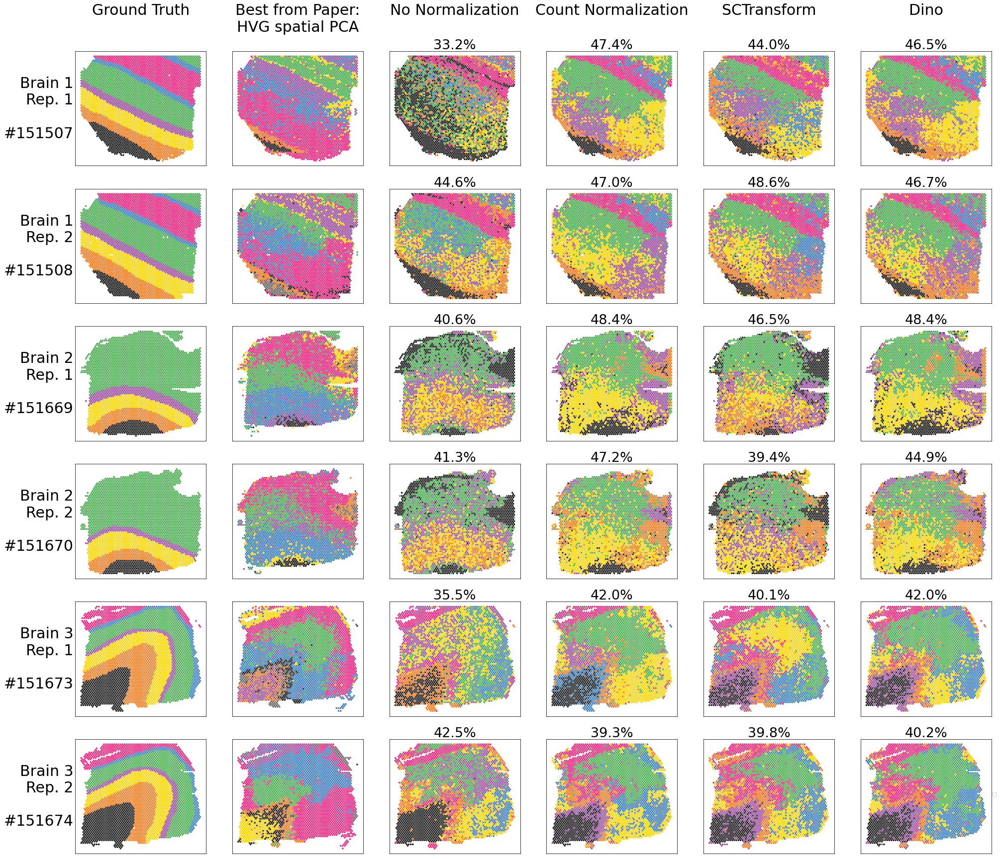

In [290]:
methods = ['raws', 'nts', 'scts', 'dinos']
method_dfs = [raws, nts, scts, dinos]
samples_to_plot = [
    151507, 151508, 
    151669, 151670, 
    151673, 151674,
]
sample_easy_names = {151507: 'Brain 1\nRep. 1', 151508: 'Brain 1\nRep. 2',
                     151669: 'Brain 2\nRep. 1', 151670: 'Brain 2\nRep. 2',
                     151673: 'Brain 3\nRep. 1', 151674: 'Brain 3\nRep. 2',}

nrows = len(samples_to_plot)
ncols = 6
fig, axs = plt.subplots(nrows=nrows, ncols=ncols)
fig.set_size_inches(9+ncols*4, 1.5+nrows*4.7)

# 1st col = Ground Truth
# 2nd col = Best unsupervised method from paper HVG_PCA_spatial
# 3rd - 6th cols = each method tested
for row, sample in enumerate(samples_to_plot):
    if row == nrows:
        break
    for col, method in enumerate(['spatialLIBD', 'HVG_PCA_spatial']):
        ax = axs[row][col]
        df = raw.obs.loc[raw.obs['sample_name'] == sample]
#         df['best_overlap_HVG_PCA_spatial']
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df[method], 
            s=15, 
            palette=palette,
            legend=False,
            ax=ax)

for row, sample in enumerate(samples_to_plot):
    if row == nrows:
        break
    for col, (method, method_df) in enumerate(zip(methods, method_dfs)):
        df = method_df[sample].obs
        col = col + 2
        ax = axs[row][col]
        
        best_acc_result = accuracy_results[method][sample][0]
        best_acc_map = best_acc_result[1]
        best_accuracy = str(round(best_acc_result[0] * 100, 1))
        
        best_bal_acc_result = balanced_accuracy_results[method][sample][0]
        best_bal_acc_map = best_bal_acc_result[1]
        best_bal_accuracy = str(round(best_bal_acc_result[0] * 100, 1))
        
#         df = nts[sample].obs.loc[nts[sample].obs['spatialLIBD'].notna()]
        df['best_overlap_kmeans'] = df['kmeans'].map(best_acc_map)
#         for col, data in zip([0, 1], ['spatialLIBD', 'best_overlap_kmeans']):
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df['best_overlap_kmeans'], 
            s=15, 
            palette=palette,
            legend=(True if (row==0) and (col==0) else False),
            ax=ax)
#         df_accuracy = accuracy_results[sample][0][0] * 100
#         ax.yaxis.set_label_position('right')
        ax.annotate(
#             'Accuracy: ' + 
            best_accuracy + '%', 
            xy=(0.5, 1.02), rotation=0, fontsize=27, ha='center',
            xycoords='axes fraction')
for row in range(len(axs)):
    for col in range(len(axs[row])):
        ax = axs[row][col]
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xticks([])
        ax.set_yticks([])

for col, col_title in zip(range(ncols), 
                          ['Ground Truth\n\n', 'Best from Paper:\nHVG spatial PCA\n', 'No Normalization\n\n',
                           'Count Normalization\n\n', 'SCTransform\n\n', 'Dino\n\n']):
    axs[0][col].set_title(col_title, fontsize=30, )

for row, sample in enumerate(samples_to_plot):
    axs[row][0].set_ylabel(sample_easy_names[sample] + '\n\n#' + str(sample), 
                           fontsize=30, ha='right', va='center', rotation=0)
# axs[0][0].legend()
test = plt.legend(loc=(1.01, 0.5), ncol=7)
# fig.suptitle()
# plt.savefig()

In [ ]:
methods = ['raws', 'nts', 'scts', 'dinos']
method_dfs = [raws, nts, scts, dinos]
samples_to_plot = [
    151507, 151508, 
    151669, 151670, 
    151673, 151674,
]
sample_easy_names = {151507: 'Brain 1\nRep. 1', 151508: 'Brain 1\nRep. 2',
                     151669: 'Brain 2\nRep. 1', 151670: 'Brain 2\nRep. 2',
                     151673: 'Brain 3\nRep. 1', 151674: 'Brain 3\nRep. 2',}

nrows = len(samples_to_plot)
ncols = 6
fig, axs = plt.subplots(nrows=nrows, ncols=ncols)
fig.set_size_inches(9+ncols*4, 1.5+nrows*4.7)

# 1st col = Ground Truth
# 2nd col = Best unsupervised method from paper HVG_PCA_spatial
# 3rd - 6th cols = each method tested
for row, sample in enumerate(samples_to_plot):
    if row == nrows:
        break
    for col, method in enumerate(['spatialLIBD', 'HVG_PCA_spatial']):
        ax = axs[row][col]
        df = raw.obs.loc[raw.obs['sample_name'] == sample]
#         df['best_overlap_HVG_PCA_spatial']
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df[method], 
            s=15, 
            palette=palette,
            legend=False,
            ax=ax)

for row, sample in enumerate(samples_to_plot):
    if row == nrows:
        break
    for col, (method, method_df) in enumerate(zip(methods, method_dfs)):
        df = method_df[sample].obs
        col = col + 2
        ax = axs[row][col]
        
        best_acc_result = accuracy_results[method][sample][0]
        best_acc_map = best_acc_result[1]
        best_accuracy = str(round(best_acc_result[0] * 100, 1))
        
        best_bal_acc_result = balanced_accuracy_results[method][sample][0]
        best_bal_acc_map = best_bal_acc_result[1]
        best_bal_accuracy = str(round(best_bal_acc_result[0] * 100, 1))
        
#         df = nts[sample].obs.loc[nts[sample].obs['spatialLIBD'].notna()]
        df['best_overlap_kmeans'] = df['kmeans'].map(best_bal_acc_map)
#         for col, data in zip([0, 1], ['spatialLIBD', 'best_overlap_kmeans']):
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df['best_overlap_kmeans'], 
            s=15, 
            palette=palette,
            legend=(True if (row==0) and (col==0) else False),
            ax=ax)
#         df_accuracy = accuracy_results[sample][0][0] * 100
#         ax.yaxis.set_label_position('right')
        ax.annotate(
#             'Accuracy: ' + 
            best_accuracy + '%', 
            xy=(0.5, 1.02), rotation=0, fontsize=27, ha='center',
            xycoords='axes fraction')
for row in range(len(axs)):
    for col in range(len(axs[row])):
        ax = axs[row][col]
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xticks([])
        ax.set_yticks([])

for col, col_title in zip(range(ncols), 
                          ['Ground Truth\n\n', 'Best from Paper:\nHVG spatial PCA\n', 'No Normalization\n\n',
                           'Count Normalization\n\n', 'SCTransform\n\n', 'Dino\n\n']):
    axs[0][col].set_title(col_title, fontsize=30, )

for row, sample in enumerate(samples_to_plot):
    axs[row][0].set_ylabel(sample_easy_names[sample] + '\n\n#' + str(sample), 
                           fontsize=30, ha='right', va='center', rotation=0)
# axs[0][0].legend()
test = plt.legend(loc=(1.01, 0.5), ncol=7)
# fig.suptitle()
# plt.savefig()

AttributeError: 'AxesSubplot' object has no attribute '_rasterizing'

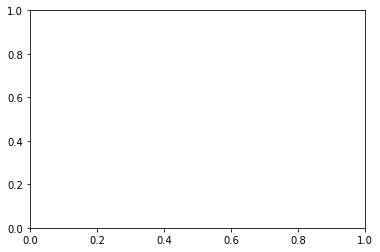

In [281]:
fig, ax = plt.subplots()
test.(ax)

([], [])

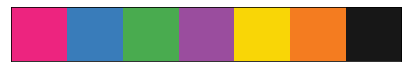

In [274]:
fp = {k: v for k, v in palette.items() if k in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']}
sns.palplot(fp.values())
plt.xticks([])

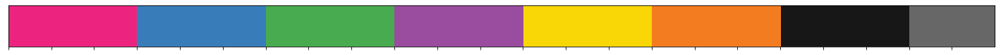

In [266]:
sns.palplot(palette.values())

In [246]:
for method in accuracy_results:
    for sample in samples:
        acc = accuracy_results[method][sample][0][1]
        bal_acc = balanced_accuracy_results[method][sample][0][1]
        print(sample, acc, bal_acc, sep='\n')

151507
{3: 'L1', 6: 'L3', 0: 'WM', 2: 'L6', 5: 'L4', 1: 'L5', 4: 'L2'}
{3: 'L1', 6: 'L4', 0: 'WM', 2: 'L3', 5: 'L6', 1: 'L5', 4: 'L2'}
151508
{4: 'L4', 6: 'L1', 1: 'WM', 3: 'L5', 0: 'L2', 2: 'L3', 5: 'L6'}
{4: 'L5', 6: 'L1', 1: 'WM', 3: 'L4', 0: 'L2', 2: 'L3', 5: 'L6'}
151669
{1: 'L5', 0: 'L4', 3: 'L3', 2: 'L6', 4: 'WM'}
{1: 'L5', 0: 'L4', 3: 'L3', 2: 'L6', 4: 'WM'}
151670
{2: 'L5', 1: 'L6', 4: 'L4', 3: 'L3', 0: 'WM'}
{2: 'L5', 1: 'L6', 4: 'L4', 3: 'L3', 0: 'WM'}
151673
{6: 'L2', 5: 'L1', 2: 'WM', 3: 'L5', 4: 'L6', 0: 'L3', 1: 'L4'}
{6: 'L2', 5: 'L1', 2: 'WM', 3: 'L5', 4: 'L6', 0: 'L3', 1: 'L4'}
151674
{3: 'L2', 2: 'L3', 1: 'WM', 6: 'L4', 0: 'L6', 4: 'L5', 5: 'L1'}
{3: 'L2', 2: 'L3', 1: 'WM', 6: 'L5', 0: 'L6', 4: 'L4', 5: 'L1'}
151507
{1: 'L4', 3: 'L3', 5: 'L1', 4: 'WM', 6: 'L6', 2: 'L5', 0: 'L2'}
{1: 'L4', 3: 'L2', 5: 'L1', 4: 'WM', 6: 'L6', 2: 'L5', 0: 'L3'}
151508
{2: 'L3', 6: 'L1', 3: 'L6', 5: 'L5', 4: 'WM', 0: 'L4', 1: 'L2'}
{2: 'L2', 6: 'L1', 3: 'L6', 5: 'L5', 4: 'WM', 0: 'L4', 1

KeyError: 151507

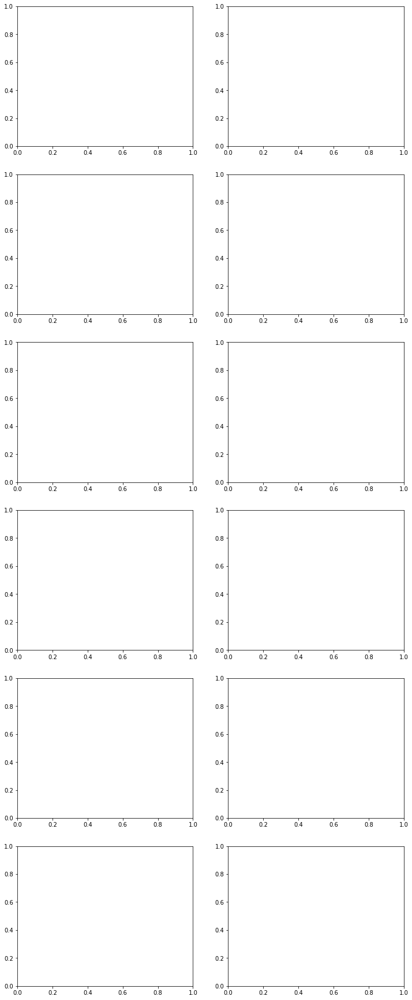

In [262]:
# sl_int_map = {'L1': 1, 'L2': 2, 'L3': 3, 'L4': 4, 'L5': 5, 'L6': 6, 'WM': 7, np.nan: 7}
nrows = 6
fig, axs = plt.subplots(nrows=nrows, ncols=2)
fig.set_size_inches(12, 3 + nrows*4.7)

for row, sample in enumerate(nts):
    if row  == nrows: 
        break
    df = nts[sample].obs.loc[nts[sample].obs['spatialLIBD'].notna()]
#     df = df.obs.loc[df.obs['spatialLIBD'].notna()]
#     df['sl_int'] = df['spatialLIBD'].map(sl_int_map)
#     df['kmeans+1'] = df['kmeans'] + 1
#     overlap_results = []
#     unique_labels = df['spatialLIBD'].unique()
#     for perm in permutations(unique_labels, r=len(unique_labels)):
#         map_ = {original: swap for original, swap in zip(df['spatialLIBD'], perm)}
#         result = balanced_accuracy_score(df['spatialLIBD'], df['spatialLIBD'].map(map_))
#         overlap_results.append((result, perm)) 
#     print(sorted(overlap_results, reverse=True)[0:20])
#     best = sorted(overlap_results, reverse=True)[0]
    best_map = accuracy_results[sample][0][1]  # accuracy or balanced_accuracy
    df['best_overlap_kmeans'] = df['kmeans'].map(best_map)
    for col, data in zip([0, 1], ['spatialLIBD', 'best_overlap_kmeans']):
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df[data], 
            s=15, 
            palette=palette,
            legend=True,
            ax=axs[row][col])
    df_accuracy = balanced_accuracy_results[sample][0][0] * 100
    axs[row][1].yaxis.set_label_position('right')
    axs[row][1].set_title('Accuracy: ' + str(round(df_accuracy , 1)) + '%', rotation=0, fontsize=16)
for i in range(nrows * 2):
    row, col = divmod(i, 2)
    axs[row][col].set_xlabel('')
    axs[row][col].set_ylabel('')
    axs[row][col].set_xticklabels([])
    axs[row][col].set_yticklabels([])
plt.gca().legend()

In [260]:
subset.obs.SNN_k50_k6.unique()

array([1, 4, 6, 2, 5, 3], dtype=int64)

In [ ]:
for sample in nts:
    sc.tl.some(nts[sample])

In [244]:
sc.pl.umap(nts[151507], color=['Cluster'], palette=palette)

KeyError: 151507

<Figure size 432x288 with 0 Axes>

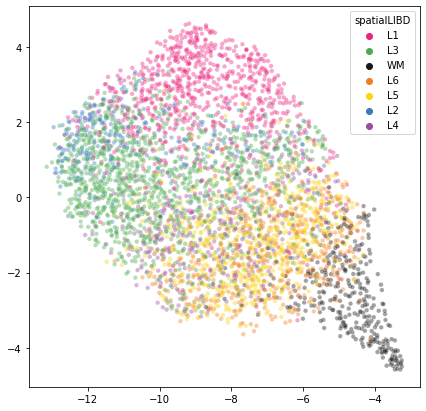

<Figure size 432x288 with 0 Axes>

In [256]:
df = d[151507]

sns.scatterplot(x=df.obsm['X_umap'][:, 0], y=df.obsm['X_umap'][:, 1], 
                hue=df.obs['spatialLIBD'], palette=palette,
                s=20, alpha=0.4)
plt.gcf().set_size_inches(7,7)
plt.figure()

In [224]:
adata.uns['spatial']

{'V1_Human_Lymph_Node': {'images': {'hires': array([[[0.5882353 , 0.6       , 0.5764706 ],
           [0.58431375, 0.6       , 0.5686275 ],
           [0.5882353 , 0.6       , 0.5686275 ],
           ...,
           [0.5803922 , 0.5921569 , 0.57254905],
           [0.5803922 , 0.59607846, 0.5764706 ],
           [0.5882353 , 0.59607846, 0.5764706 ]],
   
          [[0.5882353 , 0.6       , 0.57254905],
           [0.5882353 , 0.6       , 0.5764706 ],
           [0.58431375, 0.6       , 0.5764706 ],
           ...,
           [0.58431375, 0.59607846, 0.5803922 ],
           [0.58431375, 0.59607846, 0.5803922 ],
           [0.5882353 , 0.6       , 0.57254905]],
   
          [[0.58431375, 0.6       , 0.5803922 ],
           [0.58431375, 0.6       , 0.5764706 ],
           [0.58431375, 0.59607846, 0.57254905],
           ...,
           [0.58431375, 0.59607846, 0.5764706 ],
           [0.5803922 , 0.6       , 0.5764706 ],
           [0.58431375, 0.59607846, 0.5764706 ]],
   
          ...

In [222]:
sc.pl.spatial(d[151669], 
              img_key='../data/brain_images/151669_tissue_hires_image.png',
              )

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

In [235]:
samples

[151507, 151508, 151669, 151670, 151673, 151674]

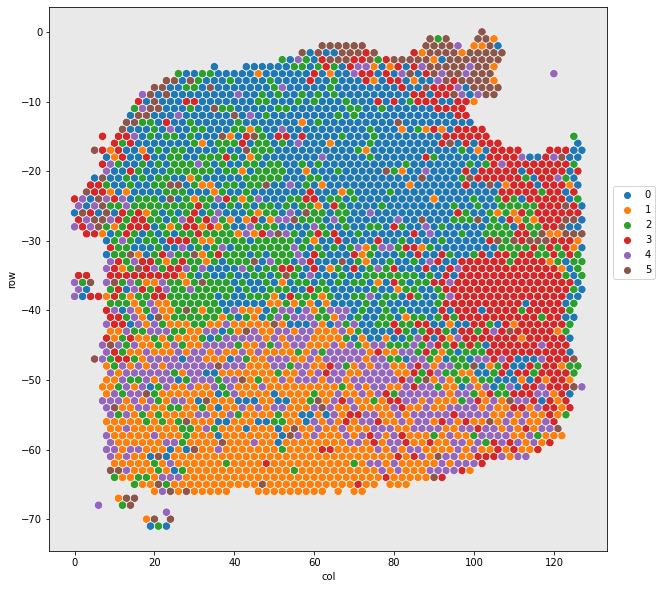

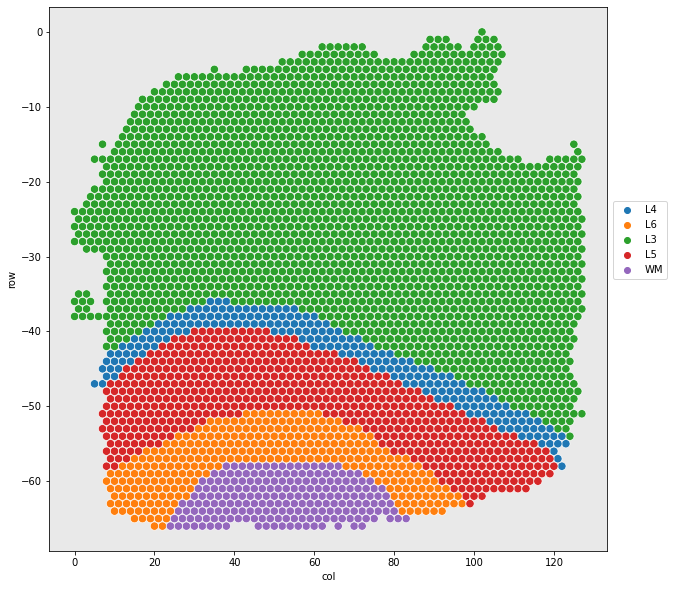

In [242]:
df = d[151670].obs

sns.scatterplot(data=df, x='col', y=-1*df.row, 
                hue=df['clusters'], s=70, 
#                 palette=palette,
               )
plt.gcf().set_size_inches(10, 10)
plt.gca().set_facecolor('#e9e9e9')
plt.legend(loc=(1.01, 0.5))

plt.figure()
sns.scatterplot(data=df, x='col', y=-1*df.row, 
                hue=df['spatialLIBD'], s=70, 
#                 palette=palette,
               )
plt.gcf().set_size_inches(10, 10)
plt.gca().set_facecolor('#e9e9e9')
plt.legend(loc=(1.01, 0.5))

In [228]:
df

,barcode,sample_name,tissue,row,col,imagerow,imagecol,Cluster,height,width,...,pseudobulk_PCA_spatial,markers_PCA_spatial,SpatialDE_UMAP_spatial,SpatialDE_pool_UMAP_spatial,HVG_UMAP_spatial,pseudobulk_UMAP_spatial,markers_UMAP_spatial,spatialLIBD,ManualAnnotation,clusters
AAACAAGTATCTCCCA-1.4,AAACAAGTATCTCCCA-1,151669,1,50,102,382.7633,457.3357,2,600,600,...,1,3,1,1,4,1,1,L4,NaN,4
AAACACCAATAACTGC-1.4,AAACACCAATAACTGC-1,151669,1,59,19,430.7381,200.0900,5,600,600,...,3,1,3,1,2,4,1,L6,NaN,5
AAACAGAGCGACTCCT-1.3,AAACAGAGCGACTCCT-1,151669,1,14,94,188.6589,432.9433,3,600,600,...,4,7,2,1,1,2,1,L3,NaN,0
AAACAGGGTCTATATT-1.4,AAACAGGGTCTATATT-1,151669,1,47,13,366.0216,181.6382,5,600,600,...,3,1,3,4,2,1,1,L4,NaN,5
AAACATTTCCCGGATT-1.4,AAACATTTCCCGGATT-1,151669,1,61,97,442.0342,441.7192,3,600,600,...,3,1,5,4,5,4,1,L6,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1.4,TTGTTGTGTGTCAAGA-1,151669,1,31,77,280.1530,380.1080,2,600,600,...,1,1,2,2,5,2,1,L3,NaN,0
TTGTTTCACATCCAGG-1.4,TTGTTTCACATCCAGG-1,151669,1,58,42,425.5176,271.3321,2,600,600,...,3,2,5,5,2,4,1,L6,NaN,0
TTGTTTCATTAGTCTA-1.4,TTGTTTCATTAGTCTA-1,151669,1,60,30,436.1836,234.1584,2,600,600,...,3,5,1,1,6,4,1,L6,NaN,2
TTGTTTCCATACAACT-1.4,TTGTTTCCATACAACT-1,151669,1,45,27,355.3105,225.0225,4,600,600,...,2,3,1,1,2,1,1,L5,NaN,6


In [220]:
df.obs.clusters

AAACAACGAATAGTTC-1    5
AAACAAGTATCTCCCA-1    1
AAACAATCTACTAGCA-1    3
AAACACCAATAACTGC-1    2
AAACAGCTTTCAGAAG-1    2
                     ..
TTGTTGTGTGTCAAGA-1    0
TTGTTTCACATCCAGG-1    1
TTGTTTCATTAGTCTA-1    2
TTGTTTCCATACAACT-1    1
TTGTTTGTGTAAATTC-1    3
Name: clusters, Length: 4226, dtype: category
Categories (6, object): ['0', '1', '2', '3', '4', '5']

In [214]:
df.uns

OverloadedDict, wrapping:
	OrderedDict([('log1p', {'base': None}), ('hvg', {'flavor': 'seurat'}), ('pca', {'params': {'zero_center': True, 'use_highly_variable': True}, 'variance': array([3.5981312 , 3.070443  , 1.6722658 , 0.8858589 , 0.7951729 ,
       0.7016566 , 0.6755867 , 0.5947717 , 0.5574369 , 0.54690886,
       0.52068275, 0.514445  , 0.5063117 , 0.49408868, 0.48655552,
       0.4819619 , 0.4759088 , 0.47207904, 0.46519017, 0.4595387 ,
       0.4578494 , 0.4542424 , 0.44998252, 0.44456172, 0.44129714,
       0.43689594, 0.43407658, 0.43161294, 0.43085727, 0.42836916,
       0.42457935, 0.42185527, 0.42002904, 0.4155014 , 0.4132904 ,
       0.4089545 , 0.4082646 , 0.40123424, 0.4004865 , 0.39941275,
       0.39556575, 0.39118537, 0.3881523 , 0.38580453, 0.38350722,
       0.3825461 , 0.3762694 , 0.3759436 , 0.37446415, 0.37079006],
      dtype=float32), 'variance_ratio': array([0.03618856, 0.03088128, 0.01681898, 0.00890961, 0.00799753,
       0.00705698, 0.00679478, 0.00598198

In [ ]:
sc.pl.spatial(df, )

In [133]:
sc.pp.pca(normtot)
sc.pp.neighbors(normtot)
sc.tl.umap(normtot)
sc.tl.leiden(normtot, key_added='clusters')

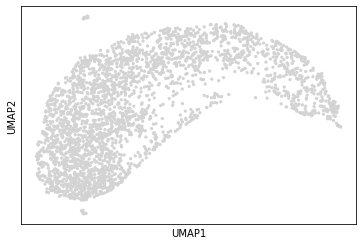

In [116]:
sc.pl.umap(normtot, color=[''])

In [55]:
test = pd.read_csv('../data/Dino_norms/151507_Dino_norm_sparse.csv', index_col=0, )
test2 = pd.read_csv('../data/Dino_norms/151508_Dino_norm_sparse.csv', index_col=0)

In [206]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


#cells after MT filter: 3861


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\scanpy\preprocessing\_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


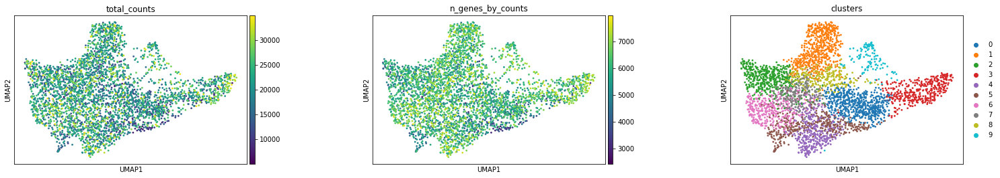

In [207]:
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

In [131]:
sct = None
for i, file in enumerate(Path('../data/SCT_norms').glob('*')):
    sample_name = file.stem.split('_')[0]
    if i == 0:
        sct = pd.read_csv(file, index_col=0).T
    else:
        sct = sct.append(pd.read_csv(file, index_col=0).T)
        
sct = sc.AnnData(sct.values, obs=normtot.obs, var=normtot.var)
sct

C:\Users\bjanderson23\anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  if __name__ == '__main__':


AnnData object with n_obs × n_vars = 23081 × 2831
    obs: 'barcode', 'sample_name', 'tissue', 'row', 'col', 'imagerow', 'imagecol', 'Cluster', 'height', 'width', 'sum_umi', 'sum_gene', 'subject', 'position', 'replicate', 'subject_position', 'discard', 'key', 'cell_count', 'SNN_k50_k4', 'SNN_k50_k5', 'SNN_k50_k6', 'SNN_k50_k7', 'SNN_k50_k8', 'SNN_k50_k9', 'SNN_k50_k10', 'SNN_k50_k11', 'SNN_k50_k12', 'SNN_k50_k13', 'SNN_k50_k14', 'SNN_k50_k15', 'SNN_k50_k16', 'SNN_k50_k17', 'SNN_k50_k18', 'SNN_k50_k19', 'SNN_k50_k20', 'SNN_k50_k21', 'SNN_k50_k22', 'SNN_k50_k23', 'SNN_k50_k24', 'SNN_k50_k25', 'SNN_k50_k26', 'SNN_k50_k27', 'SNN_k50_k28', 'GraphBased', 'Maynard', 'Martinowich', 'layer_guess', 'layer_guess_reordered', 'layer_guess_reordered_short', 'expr_chrM', 'expr_chrM_ratio', 'SpatialDE_PCA', 'SpatialDE_pool_PCA', 'HVG_PCA', 'pseudobulk_PCA', 'markers_PCA', 'SpatialDE_UMAP', 'SpatialDE_pool_UMAP', 'HVG_UMAP', 'pseudobulk_UMAP', 'markers_UMAP', 'SpatialDE_PCA_spatial', 'SpatialDE_pool_PC

In [ ]:
    #     df = df.obs.loc[df.obs['spatialLIBD'].notna()]
    #     df['sl_int'] = df['spatialLIBD'].map(sl_int_map)
    #     df['kmeans+1'] = df['kmeans'] + 1
    #     overlap_results = []
    #     unique_labels = df['spatialLIBD'].unique()
    #     for perm in permutations(unique_labels, r=len(unique_labels)):
    #         map_ = {original: swap for original, swap in zip(df['spatialLIBD'], perm)}
    #         result = balanced_accuracy_score(df['spatialLIBD'], df['spatialLIBD'].map(map_))
    #         overlap_results.append((result, perm)) 
    #     print(sorted(overlap_results, reverse=True)[0:20])
    #     best = sorted(overlap_results, reverse=True)[0]
        best_map = accuracy_results[sample][0][1]  # accuracy or balanced_accuracy

In [ ]:
# sl_int_map = {'L1': 1, 'L2': 2, 'L3': 3, 'L4': 4, 'L5': 5, 'L6': 6, 'WM': 7, np.nan: 7}
nrows = 6
fig, axs = plt.subplots(nrows=nrows, ncols=2)
fig.set_size_inches(12, 3 + nrows*4.7)

for row, sample in enumerate(nts):
    if row  == nrows: 
        break
    df = nts[sample].obs.loc[nts[sample].obs['spatialLIBD'].notna()]
#     df = df.obs.loc[df.obs['spatialLIBD'].notna()]
#     df['sl_int'] = df['spatialLIBD'].map(sl_int_map)
#     df['kmeans+1'] = df['kmeans'] + 1
#     overlap_results = []
#     unique_labels = df['spatialLIBD'].unique()
#     for perm in permutations(unique_labels, r=len(unique_labels)):
#         map_ = {original: swap for original, swap in zip(df['spatialLIBD'], perm)}
#         result = balanced_accuracy_score(df['spatialLIBD'], df['spatialLIBD'].map(map_))
#         overlap_results.append((result, perm)) 
#     print(sorted(overlap_results, reverse=True)[0:20])
#     best = sorted(overlap_results, reverse=True)[0]
    best_map = accuracy_results[sample][0][1]  # accuracy or balanced_accuracy
    df['best_overlap_kmeans'] = df['kmeans'].map(best_map)
    for col, data in zip([0, 1], ['spatialLIBD', 'best_overlap_kmeans']):
        sns.scatterplot(
            x=df['col'], y=-1*df['row'], 
            hue=df[data], 
            s=15, 
            palette=palette,
            legend=True,
            ax=axs[row][col])
    df_accuracy = balanced_accuracy_results[sample][0][0] * 100
    axs[row][1].yaxis.set_label_position('right')
    axs[row][1].set_title('Accuracy: ' + str(round(df_accuracy , 1)) + '%', rotation=0, fontsize=16)
for i in range(nrows * 2):
    row, col = divmod(i, 2)
    axs[row][col].set_xlabel('')
    axs[row][col].set_ylabel('')
    axs[row][col].set_xticklabels([])
    axs[row][col].set_yticklabels([])
plt.gca().legend()